# Advanced Lane Finding

## Import

In this section, calibration images, test images, and APIs are imported.

In [3]:
import cv2
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
from PIL import Image
%matplotlib inline

In [4]:
def import_images(image_path):
    image_list = []
    for filename in glob.glob(image_path + '/*'):
        im = Image.open(filename)
        image_list.append(np.array(im))
    return np.array(image_list)

In [5]:
# images for calibrating camera
cam_cal_imgs = import_images('camera_cal')
# provided test images for testing lane detection
test_imgs = import_images('test_images')

## Camera Calibration

Here, we find the object points and image points by detecting corners from a series of distorted chessboard images. The object points represent the corners of an undistorted chess board, whereas the image points represent the corners of a distorted chessboard. The object points always remain the same, whereas the image points are calculated using OpenCV’s findChessboardCorners() function. For these images, the number of corners for a given row is expected to be 9 and the number of corners in a given column is expected to be 6. Whenever findChessboardCorners() finds the expected number of corners in a distorted image, we record another pair of object points and detected image points.

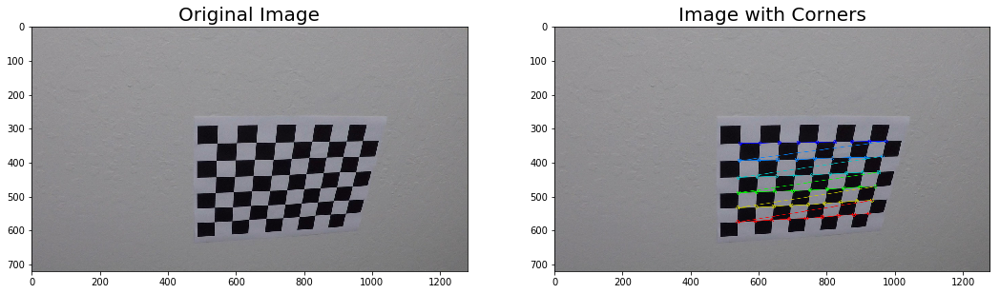

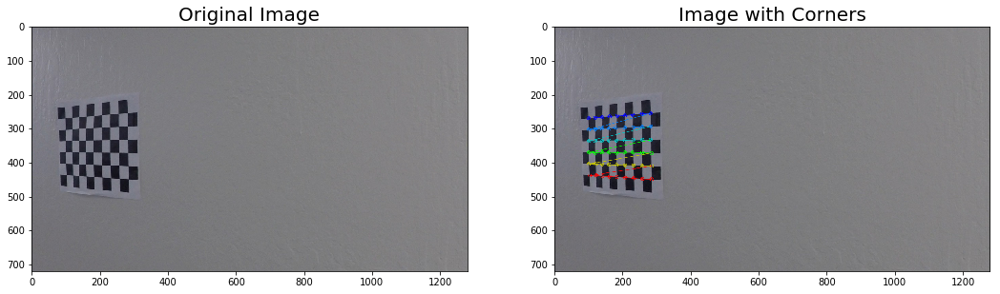

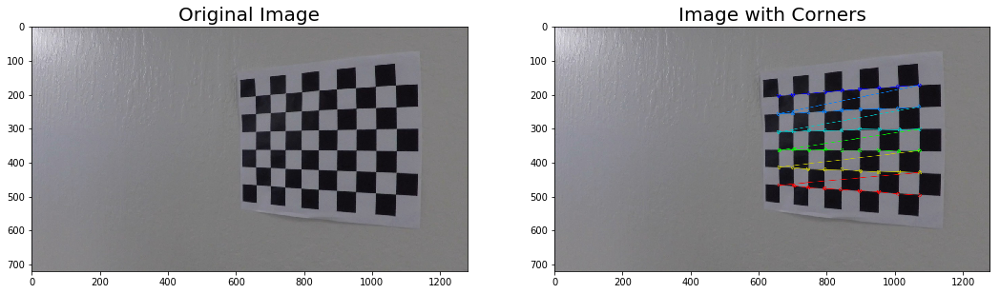

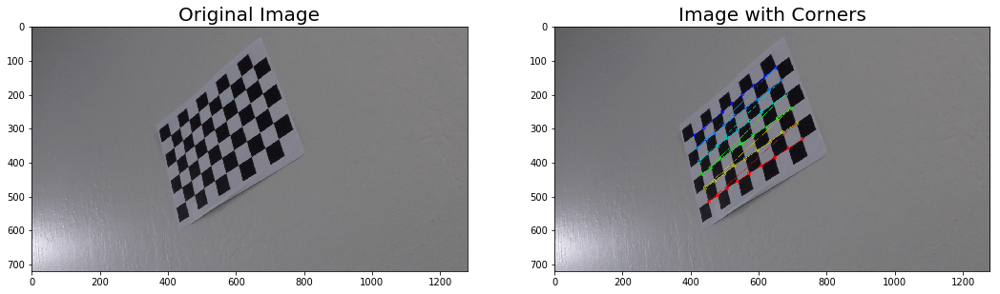

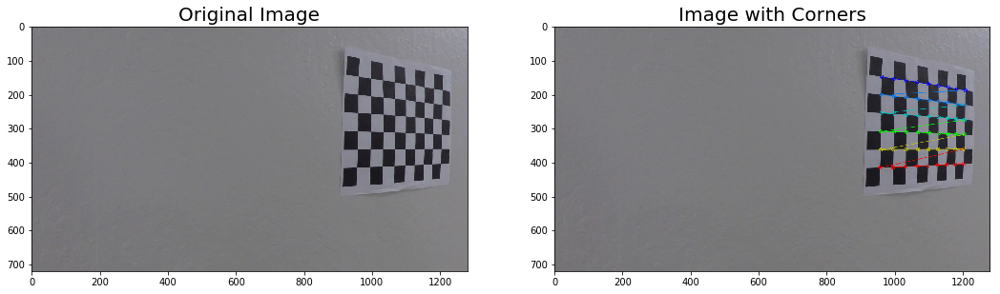

...

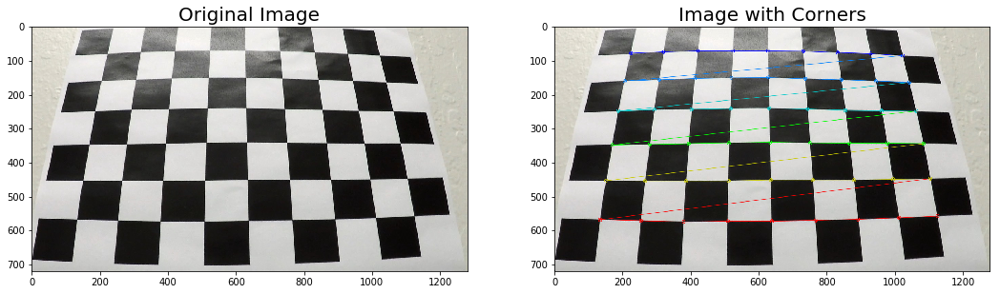

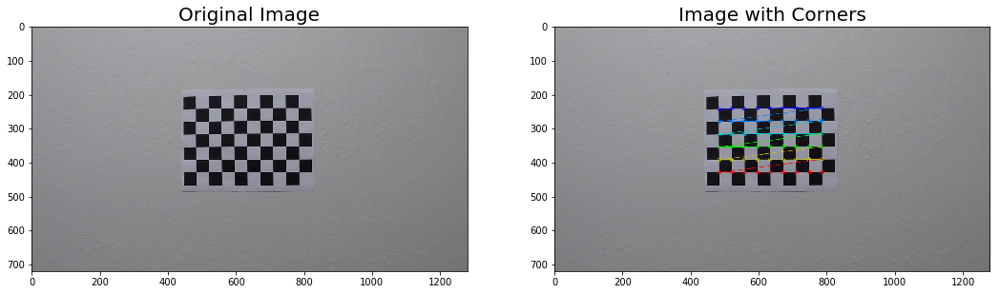

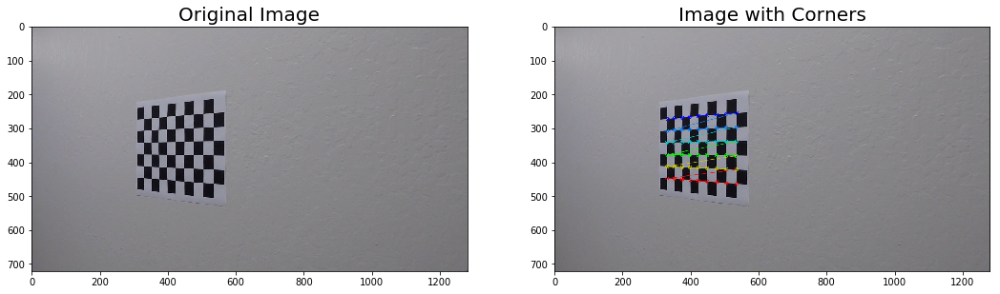

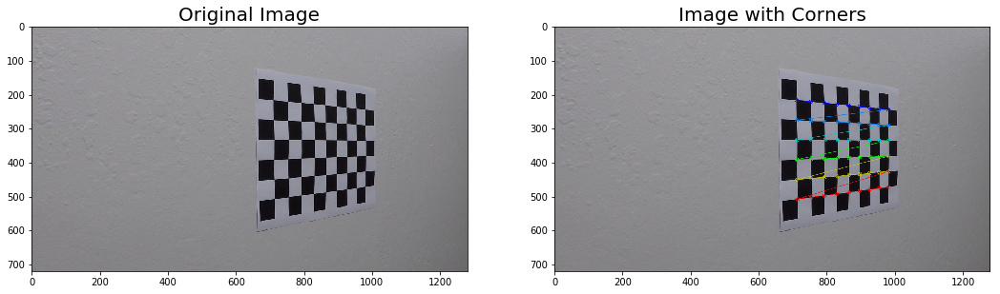

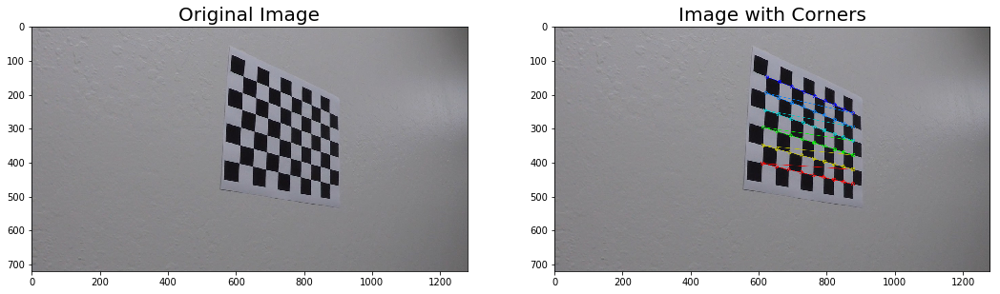

In [6]:
# number of inside corners in x and y
nx, ny = 9, 6

objp = np.zeros((ny * nx, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

objpoints, imgpoints = [], []

for img in cam_cal_imgs:
    tmp = np.copy(img)
    # Convert to grayscale
    gray = cv2.cvtColor(tmp, cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        cv2.drawChessboardCorners(tmp, (nx, ny), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=20)
        ax2.imshow(tmp)
        ax2.set_title('Image with Corners', fontsize=20)

objpoints, imgpoints = np.array(objpoints), np.array(imgpoints)

## Distortion Correction

Pass object points, image points, and image size into OpenCV’s calibrateCamera() function. This returns the desired camera matrix and distortion coefficients used to un-distort a given image taken with the same camera.

In [7]:
# Remove distortion from image
def cal_undistort(img, objpoints, imgpoints):
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    res = cv2.undistort(img, mtx, dist, None, mtx)
    return res

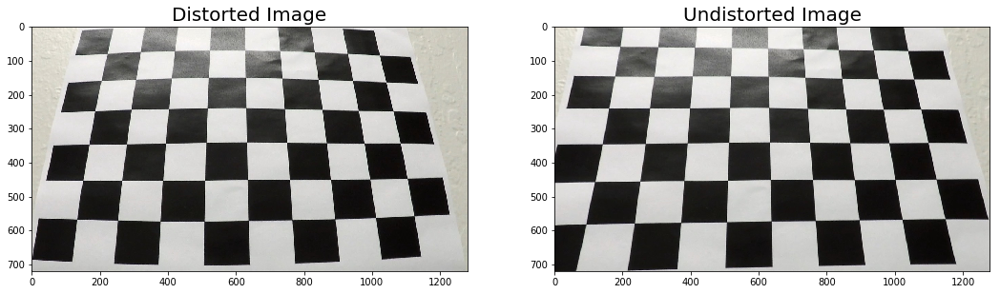

In [8]:
# One example of removing distortion from a chessboard image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
ax1.imshow(cam_cal_imgs[13])
ax1.set_title('Distorted Image', fontsize=20)
ax2.imshow(cal_undistort(cam_cal_imgs[13], objpoints, imgpoints))
ax2.set_title('Undistorted Image', fontsize=20)

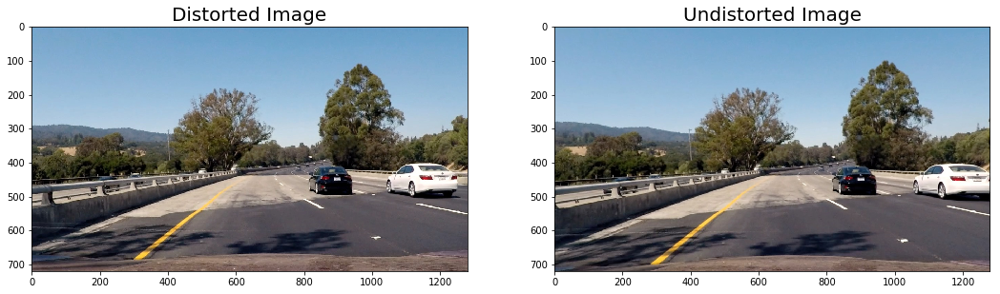

In [9]:
# One example of removing distortion from a road image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
ax1.imshow(test_imgs[5])
ax1.set_title('Distorted Image', fontsize=20)
ax2.imshow(cal_undistort(test_imgs[5], objpoints, imgpoints))
ax2.set_title('Undistorted Image', fontsize=20)

In [10]:
# remove distortion from test images
for i in range(len(test_imgs)):
    test_imgs[i] = cal_undistort(test_imgs[i], objpoints, imgpoints)

## Color/Gradient Threshold

Below are helper functions used for cropping and detecting lane lines.

In [11]:
# crops an image given four vertices, used for reducing noise
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

# emphasizes white and yellow lanes with HLS thresholding
def lane_binary(rgb_img):
    hls = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    yellow, white = np.zeros_like(H), np.zeros_like(H)
    # threshold for yellow lane
    yellow[(H >= 11) & (H <= 33) & (S >= 86) & (L >= 20)] = 1
    # threshold for white lane
    white[(L >= 198)] = 1
    return cv2.bitwise_or(white, yellow), white, yellow

# used for calculating source points
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` is the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((*img.shape, 3), dtype=np.uint8)
    return lines, line_img

# default crop consisting of constant region of interest used for calculating source points
def default_crop(image):
    processed_image = np.copy(image)
    xsize = processed_image.shape[1]
    ysize = processed_image.shape[0]
    min_y = ysize / 1.65
    # min_y = ysize / 2
    left_bottom = (1 / 32 * xsize, ysize)
    right_bottom = (31 / 32 * xsize, ysize)
    left_top = (14.5 / 32 * xsize, min_y)
    right_top = (17.5 / 32 * xsize, min_y)
    vertices = np.array([[left_bottom, right_bottom, right_top, left_top]], dtype=np.int32)
    processed_image = region_of_interest(processed_image, vertices)
    return processed_image

# calculates a line using point slope form, returning the top and bottom points
# this is used to find the source points from outside of a trapezoid-like shape
def calc_line(point, m, min_y, max_y):
    x1 = (min_y - point[1]) / m + point[0] if m != 0 else point[0]
    x2 = (max_y - point[1]) / m + point[0] if m != 0 else point[0]
    return np.array([x1, min_y, x2, max_y]).astype('int64')

## Perspective Transform

The first step is to convert the image to binary using the algorithm explained in the previous question.  

The second step is to perform a default trapezoidal crop of the image to simplify calculations. This trapezoid is represented by four vertices. Let xsize and ysize be the number of pixels in the x and y directions, respectively. Then the lower left vertex is (1 / 32 * xsize, ysize), the lower right vertex is (31 / 32 xsize, ysize), the upper left vertex is (14.5 / 32 * xsize, ysize / 1.65), and the upper right vertex is (17.5 / 32 * xsize, ysize / 1.65). Note that these values were found through trial and error.  

The third step is to identify the lane lines to find the source points. This is done using the same technique as in the first lane detection project, using OpenCV’s HoughLinesP() method. Outlier lines are rejected, the average negative and positive slope lines are calculated, and a weighted mean of the x values for each the left and right lanes are calculated. The two lane lines are then found with point-slope form calculations. After identifying the two lane lines, two of the vertex points just left of the left lane and two vertex points just right of the right lane were chosen as the source points. This is done in the calc_src() function in the following code block.  

The last step is to pass the source and destination points in to OpenCV’s getPerspectiveTransform() and pass the perspective transform along with the original image into OpenCV’s warpPerspective() function. Note that the destination points are constantly the four corners of the original image.  

In [12]:
# Returns birds eye view of road
def birds_eye(img, src):
    offset = 0 # offset for dst points
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])
    # Grab the outer four detected corners
    # destination points are four corners of input img
    dst = np.float32([[offset, offset], [img_size[0] - offset, offset], 
                                 [img_size[0] - offset, img_size[1] - offset], 
                                 [offset, img_size[1] - offset]])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)

    # Return the resulting image and inverse perspective transform
    return warped, Minv

def calc_src(curr_img, ksize=3, rho=1, theta=np.pi/180, threshold=50, min_line_len=20, max_line_gap=40):
    # convert to binary image with detected lanes
    binary, _, _ = lane_binary(curr_img)
    # crop into trapezoid
    tmp = default_crop(binary)
    # find hough lines
    lines, processed_image = hough_lines(tmp, rho, theta, threshold, min_line_len, max_line_gap)
    # define variables to find point-slope form lines
    total_pos_x, total_pos_y = 0.0, 0.0
    pos_x_count, pos_y_count = 0, 0
    total_neg_x, total_neg_y = 0.0, 0.0
    neg_x_count, neg_y_count = 0, 0
    total_neg_slope, total_pos_slope = 0.0, 0.0
    neg_slope_count, pos_slope_count = 0, 0
    min_y, max_y = 600, -1
    test_lines = []
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x1 - x2 == 0:
                continue
            m = float((y1 - y2)) / (x1 - x2)
            # filter out extreme slopes
            if abs(m) < 0.33 or abs(m) > 1:
                 continue
            min_y = min(min_y, y1, y2)
            max_y = max(max_y, y1, y2)
            test_lines.append(line)
            if m < 0:
                total_neg_x += x1 + x2
                total_neg_y += y1 + y2
                neg_x_count += 2
                neg_y_count += 2
                total_neg_slope += m
                neg_slope_count += 1
            else:
                total_pos_x += x1 + x2
                total_pos_y += y1 + y2
                pos_x_count += 2
                pos_y_count += 2
                total_pos_slope += m
                pos_slope_count += 1
    # if one of the lane is not detected, return None
    if pos_slope_count == 0 or neg_slope_count == 0:
        return None
    # find average x, y points and average slopes
    if neg_x_count != 0 and neg_y_count != 0:
        avg_neg_x, avg_neg_y = total_neg_x / neg_x_count, total_neg_y / neg_y_count
    if pos_x_count != 0 and pos_y_count != 0:
        avg_pos_x, avg_pos_y = total_pos_x / pos_x_count, total_pos_y / pos_y_count
    if neg_slope_count != 0 and pos_slope_count != 0:
        avg_neg_slope, avg_pos_slope = total_neg_slope / neg_slope_count, total_pos_slope / pos_slope_count
    
    # left lane
    pos_slope_line = calc_line((avg_pos_x, avg_pos_y), avg_pos_slope, min_y, max_y)
    # right lane
    neg_slope_line = calc_line((avg_neg_x, avg_neg_y), avg_neg_slope, min_y, max_y)

    new_lines = np.array([np.array([pos_slope_line, neg_slope_line])])
    
    # find four source point vertices by first finding top and bottom points of each line
    # and choosing two points slightly left of these points for left lane
    # and choosing two points slightly right of these points for right lane
    offset = 110
    # bottom left
    v1 = (new_lines[0][1][2] - offset, max_y)
    min_x = new_lines[0][1][2] - offset
    # bottom right
    v2 = (new_lines[0][0][2] + offset, max_y)
    max_x = new_lines[0][0][2] + offset
    # top right
    v3 = ((new_lines[0][0][2] - new_lines[0][0][0]) / 9 + new_lines[0][0][0] + offset / 3, 1 / 9 * (max_y - min_y) + min_y)
    # top left
    v4 = (new_lines[0][1][0] - (new_lines[0][1][0] - new_lines[0][1][2]) / 9 - offset / 3, 1 / 9 * (max_y - min_y) + min_y)
    vertices1 = np.array([[v1, v2, v3, v4]])
    res = np.float32([v4, v3, v2, v1])
    return res

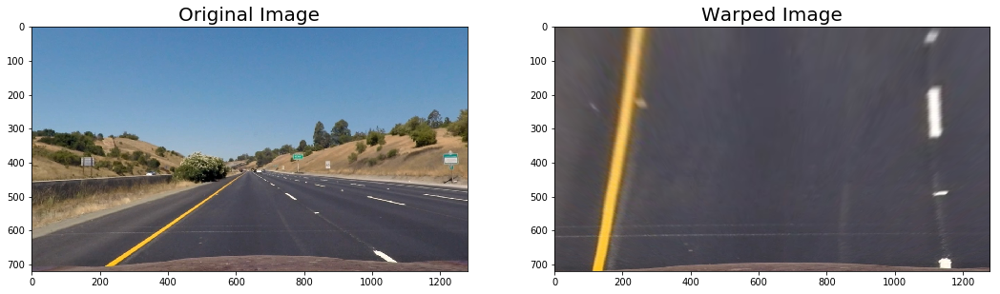

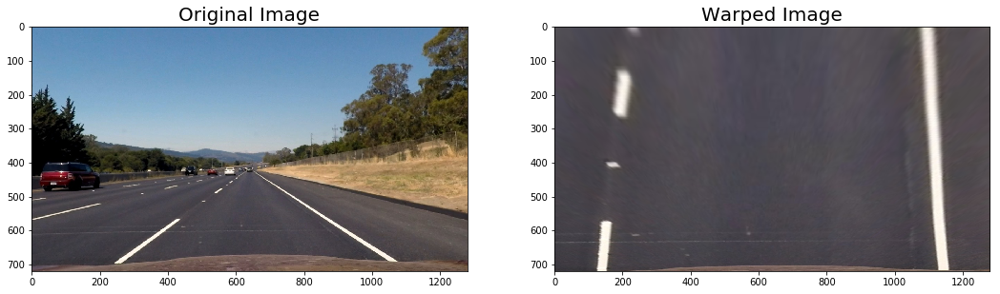

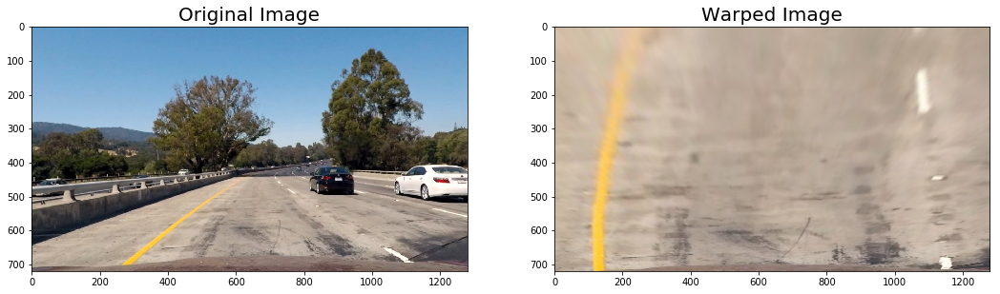

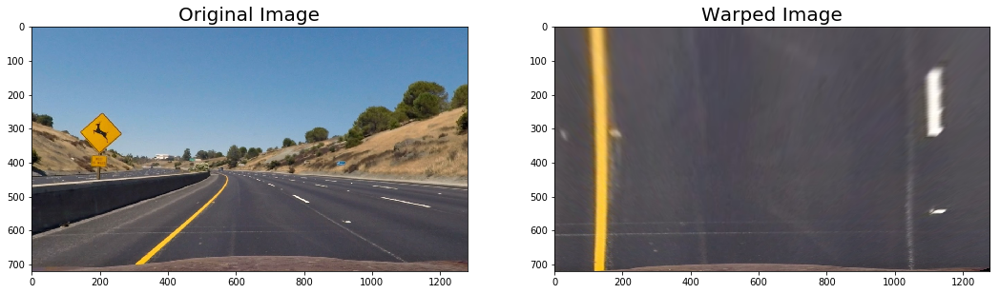

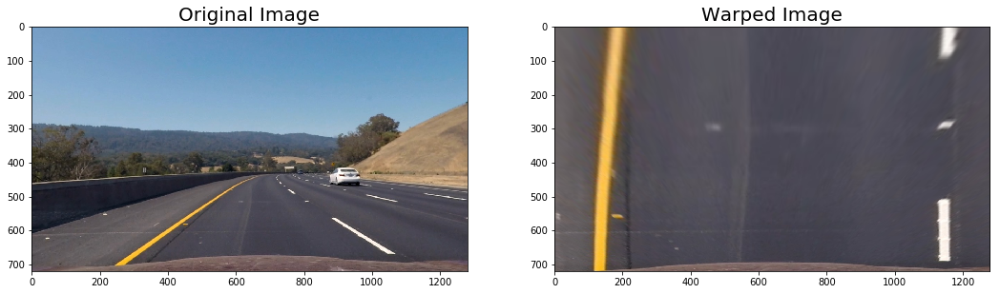

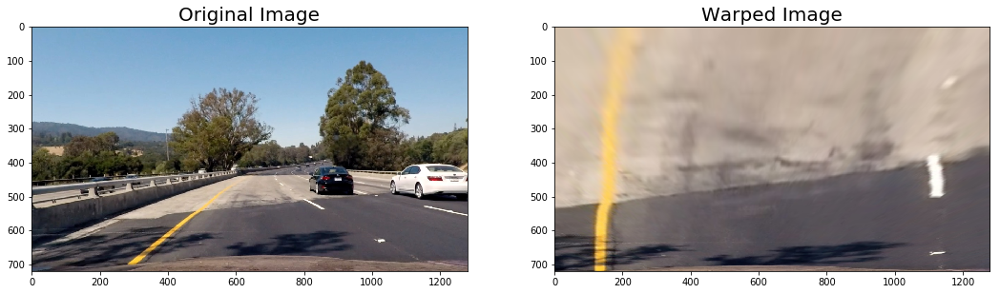

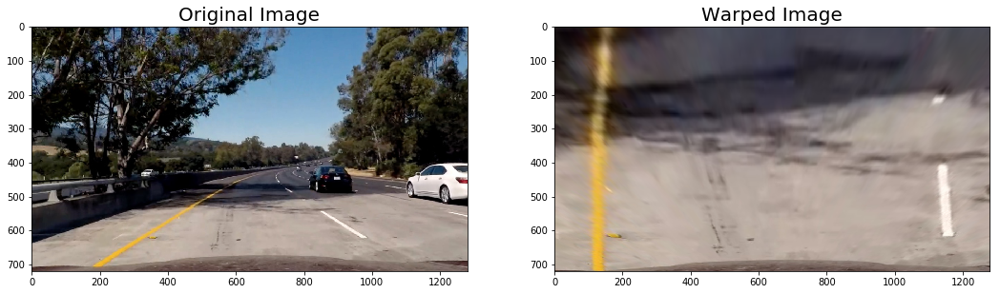

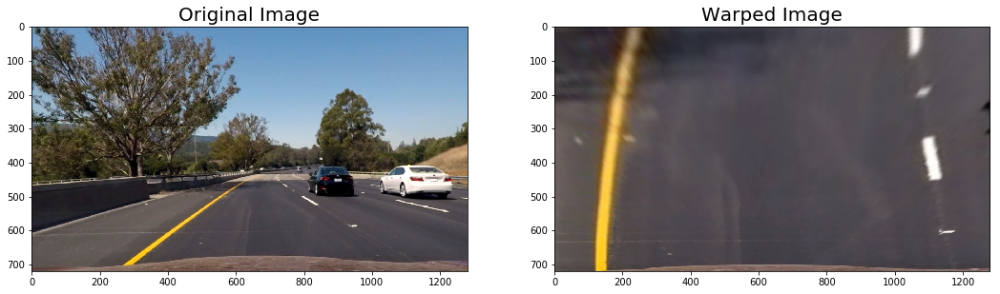

In [13]:
# show examples of warped images
warped_imgs, Minvs = [], []
for i, img in enumerate(test_imgs):
    src = calc_src(img)
    # weighted_image = weighted_img(processed_image, img)
    # res = birds_eye(weighted_image, src=src)
    res, Minv = birds_eye(img, src)
    Minvs.append(Minv)
    warped_imgs.append(res)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(res)
    ax2.set_title('Warped Image', fontsize=20)
warped_imgs, Minvs = np.array(warped_imgs), np.array(Minvs)

## Detect Lane Lines

The warped images in the previous section are first converted to binary images that emphasize the lane lines using HLS thresholding.

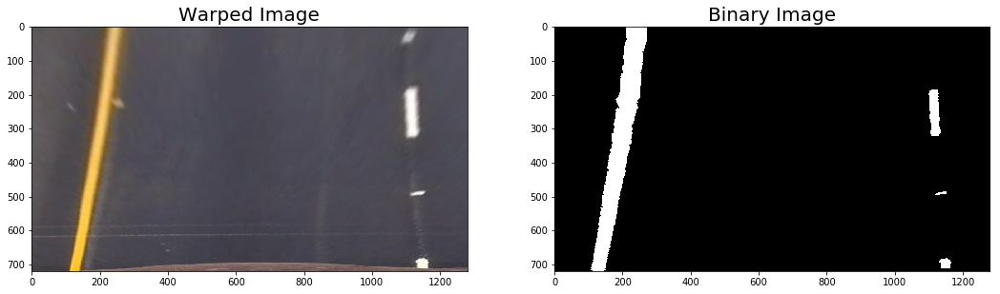

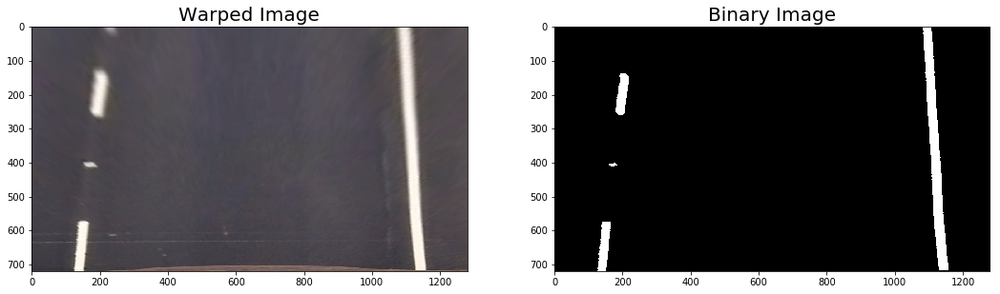

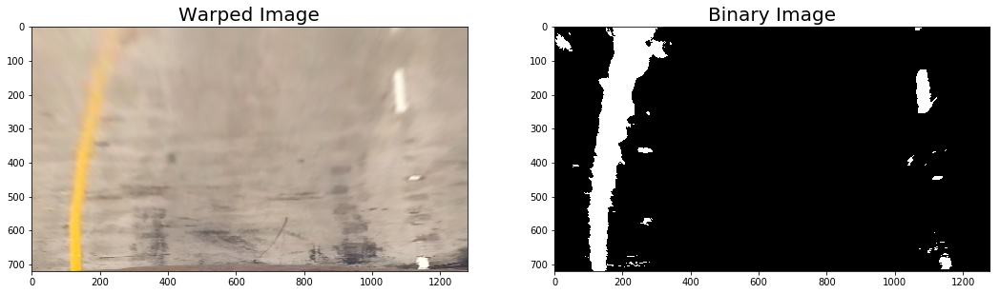

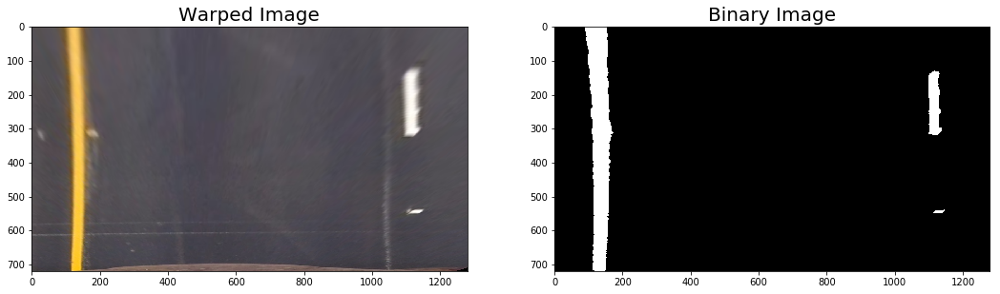

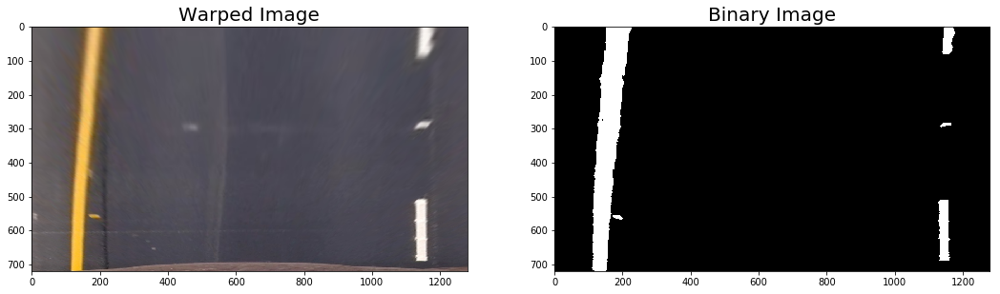

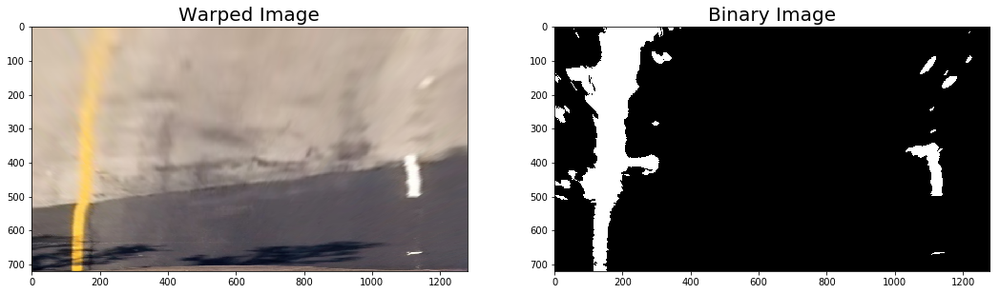

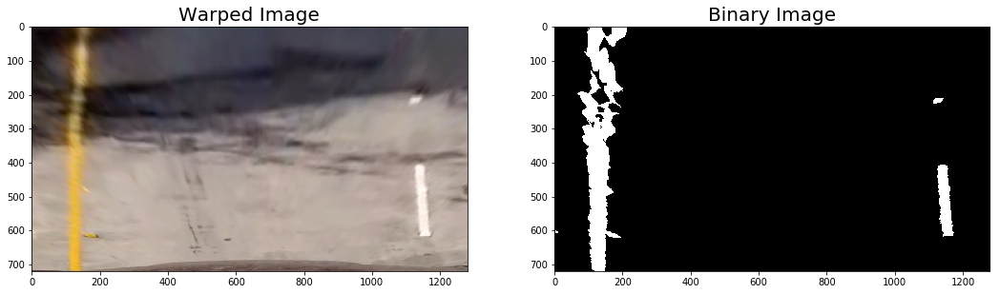

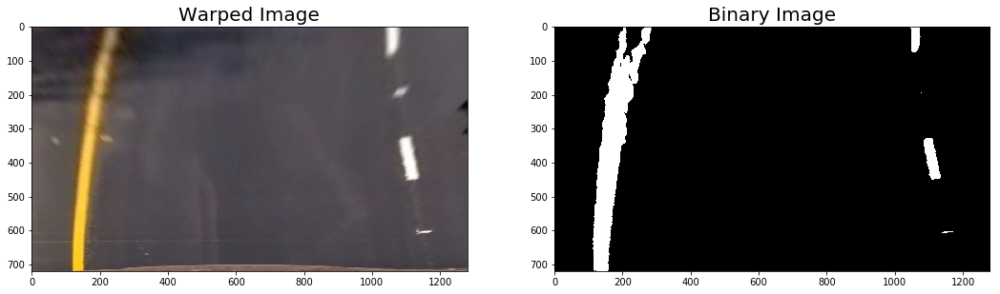

In [14]:
binary_warped_imgs = []
for i in range(len(warped_imgs)):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
    ax1.imshow(warped_imgs[i])
    ax1.set_title('Warped Image', fontsize=20)
    b, _, _ = lane_binary(warped_imgs[i])
    binary_warped_imgs.append(b)
    ax2.imshow(b, cmap='gray')
    ax2.set_title('Binary Image', fontsize=20)
binary_warped_imgs = np.array(binary_warped_imgs)

Then, a histogram along the x axis is calculated such that the values of the histogram correspond to the number of pixels at that x value. The lane-line pixels are found using a sliding window. With the histogram represented as a numpy array, the two modes can be easily found by starting at the midpoint and iterating outward. These two modes are used as the starting points for the sliding windows.

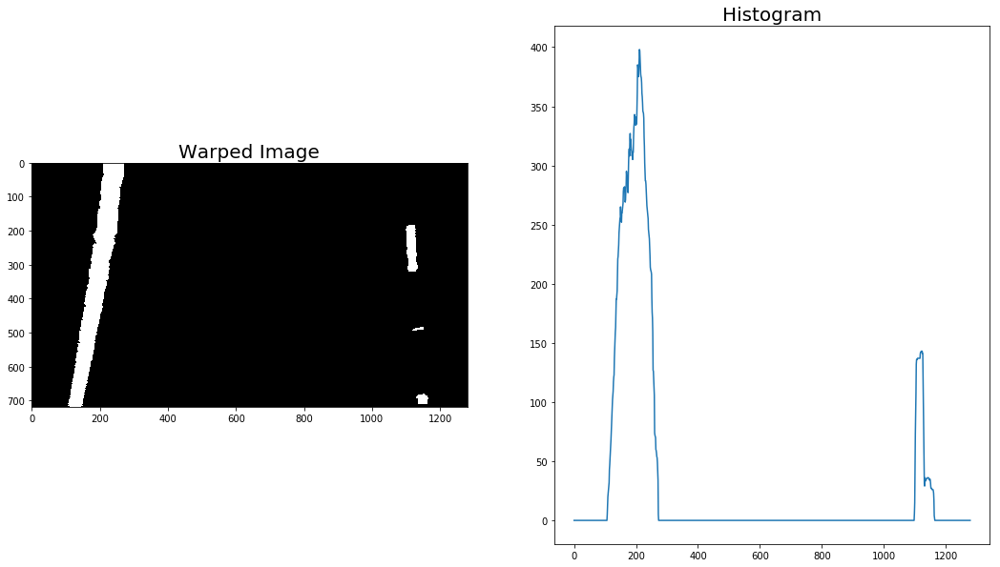

In [15]:
res, _, _ = lane_binary(warped_imgs[0])
vert_hist = np.sum(res, axis=0)
                        
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
ax1.imshow(res, cmap='gray')
ax1.set_title('Warped Image', fontsize=20)
ax2.plot(vert_hist)
ax2.set_title('Histogram', fontsize=20)

## Determine Lane Curvature

Just as in the class example, each lane is found with 9 windows each, the windows have a width of 100, and a minimum of 50 pixels inside the window is required to recenter the window.

Using this technique, the left and right line-lane pixels are effectively identified by keeping track of nonzero values inside the windows. For a first attempt, this is done blindly for each frame. The nonzero pixels values are then used to calculate the second degree polynomial coefficients using numpy’s polyfit() function, and these coefficients are used to fit the polynomial to all y values.  

Calculating the radius of curvature is fairly straightforward after determining the polynomial coefficients. For each lane, the radius of curvature is calculated with the following formula:

R_curve = (1 + (2Ay + B)^2)^1.5 / abs(2A)   

where A and B are the coefficients for the second and first degree, respectively.

Finding the center of the vehicle is done by first drawing the lane on a perspective transformed blank image, warping it with the inverse perspective transform, and finding the lower left and right corners of this new warp image. Assuming the camera is centered, the midpoint between the lower left and right corners denotes the vehicle’s position. This midpoint is then compared to the middle x value of the image (newwarp_gray.shape[1] / 2) to find the offset.

In [30]:
def find_lanes_and_curvature(img, binary_warped, Minv):
    # binary_warped = remove_noise(img, is_binary=False)
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    midpoint = np.int(histogram.shape[0]/2)

    # left mode
    leftx_base = np.argmax(histogram[:midpoint])
    # right mode
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # number of windows
    nwindows = 9
    window_height = np.int(binary_warped.shape[0]/nwindows)

    # returns indices of elements that are non-zero
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # current left mode
    leftx_current = leftx_base
    # current right mode
    rightx_current = rightx_base

    # width of window is +/- margin
    margin = 100
    # minimum number of pixels found to recenter window
    minpix = 50

    # left lane pixel indices
    left_lane_inds = []
    # right lane pixel indices
    right_lane_inds = []

    for window in range(nwindows):
        # bottom of window
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        # top of window
        win_y_high = binary_warped.shape[0] - window*window_height
        # left of left window
        win_xleft_low = leftx_current - margin
        # right of left window
        win_xleft_high = leftx_current + margin
        # left of right window
        win_xright_low = rightx_current - margin
        # right of right window
        win_xright_high = rightx_current + margin

        # output image, two corners, color, thickness
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)

        # identify nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # record nonzero pixels in x and y for both left and right lanes
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # if found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # convert left_lane_inds to 1-dimensional numpy array
    # convert right_lane_inds to 1-dimensional numpy array
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # nonzero x indices of left lane
    leftx = nonzerox[left_lane_inds]
    # nonzero y indices of left lane
    lefty = nonzeroy[left_lane_inds]
    # nonzero x indices of right lane
    rightx = nonzerox[right_lane_inds]
    # nonzero y indices of right lane
    righty = nonzeroy[right_lane_inds]
    
    # if a lane is missing, return None
    if len(lefty) == 0 or len(leftx) == 0 or len(righty) == 0 or len(rightx) == 0:
        return None, None, 0, 0, 0, None
    
    # get second degree polynomial coefficients for points on left lane
    left_fit = np.polyfit(lefty, leftx, 2)
    # get second degree polynomial coefficients for points on right lane
    right_fit = np.polyfit(righty, rightx, 2)
    
    # generate evenly spaced numbers from 0 to largest y value
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    # fit second degree polynomial for left lane
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    # fit second degree polynomial for right lane
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    y_eval = np.max(ploty)
    # calculate left curvature
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    # calculate right curvature
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warp_zero.shape[1], warp_zero.shape[0]))
    newwarp_gray = cv2.cvtColor(newwarp, cv2.COLOR_RGB2GRAY)
    
    # find lower left and right corners of newwarp region
    # used to calculate vehicles's offset from center
    leftmost_x = newwarp_gray.shape[1]
    rightmost_x = -1
    flag = False
    for i in range(newwarp_gray.shape[0] - 1, -1, -1):
        if flag:
            break
        for j in range(newwarp_gray.shape[1] - 1, -1, -1):
            if newwarp_gray[i][j] != 150:
                continue
            flag = True
            leftmost_x = min(leftmost_x, j)
            rightmost_x = max(rightmost_x, j)
    
    # convert pixels to meters
    meters_per_pix = 3.7 / 700
    # absolute center - car's center
    center = meters_per_pix * (img.shape[1] / 2 - (rightmost_x + leftmost_x) / 2)
    # left curve radius
    left_curverad = meters_per_pix * left_curverad
    # right curve radius
    right_curverad = meters_per_pix * right_curverad
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    return result, newwarp, left_curverad, right_curverad, center, color_warp

/Users/aaroniglesias/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


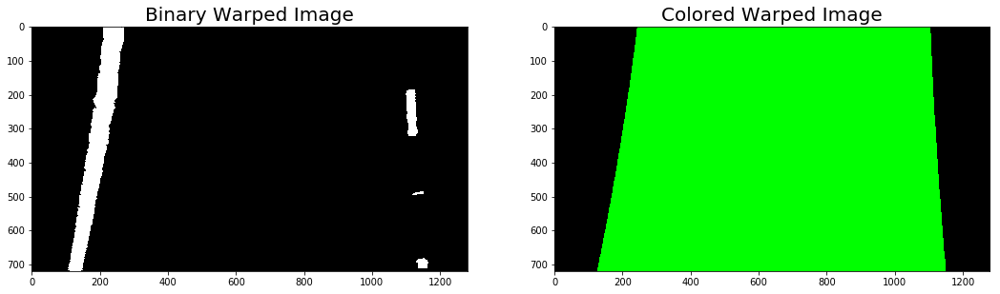

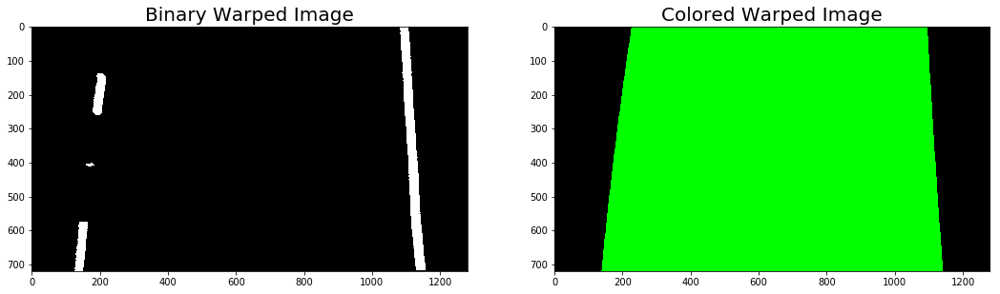

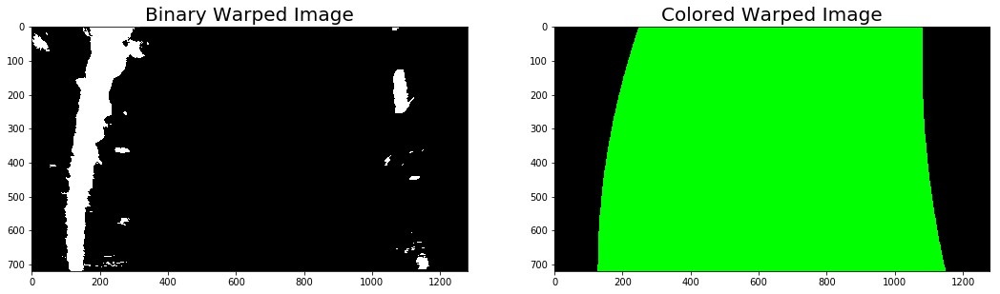

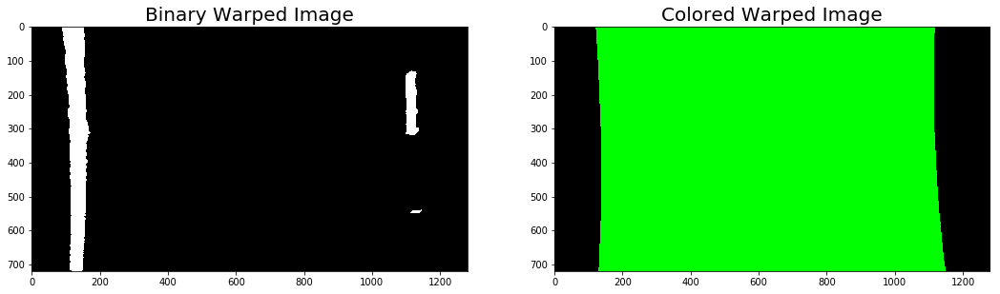

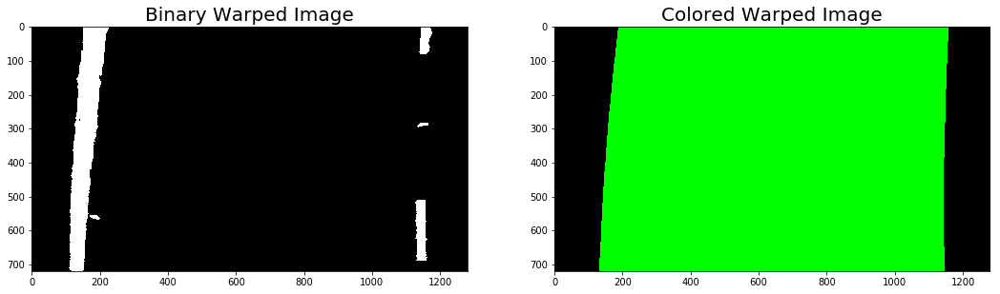

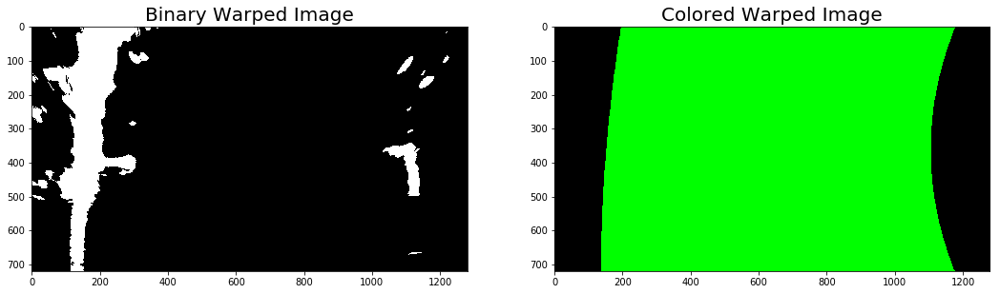

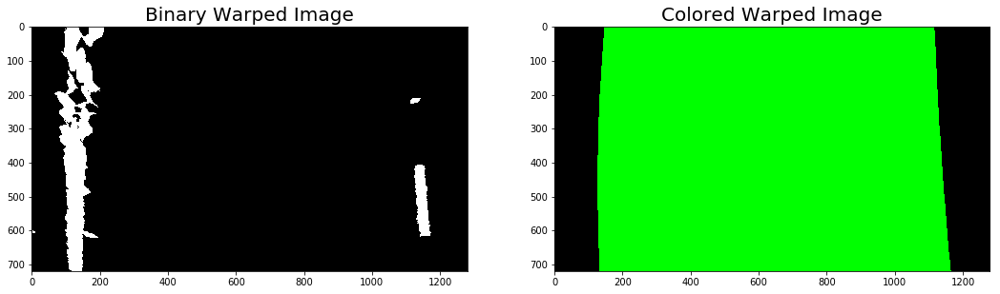

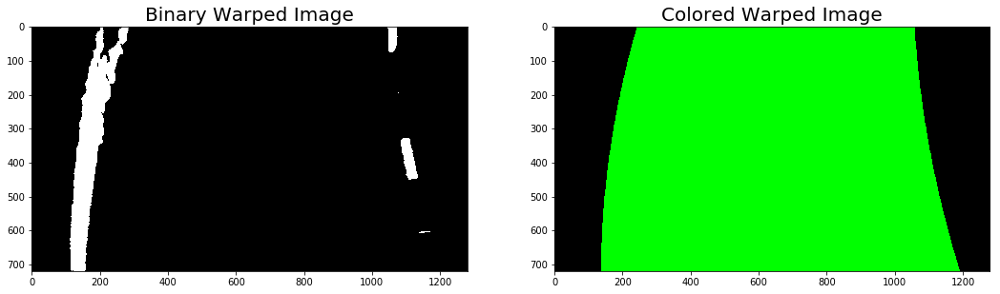

In [31]:
# examples of lane detection on binary warped image
for img in test_imgs:
    src = calc_src(img)
    warped, Minv = birds_eye(img, src=src)
    binary_warped, _, _ = lane_binary(warped)
    _, _, _, _, _, color_warp = find_lanes_and_curvature(img, binary_warped, Minv)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
    ax1.imshow(binary_warped, cmap='gray')
    ax1.set_title('Binary Warped Image', fontsize=20)
    ax2.imshow(color_warp)
    ax2.set_title('Colored Warped Image', fontsize=20)

## Pipeline

Here, all previous steps are combined into a pipeline to detect lane lines.

In [25]:
prev_src = None
prev_warp = None
prev_left_curve = None
prev_right_curve = None
prev_center = None

def lane_detection(rgb_img):
    # cache previous values in case source points or lanes are not detected
    global prev_src, prev_warp, prev_left_curve, prev_right_curve, prev_center
    # undistort image
    img = cal_undistort(rgb_img, objpoints, imgpoints)
    # calculate source points
    src = calc_src(img)
    # if no source points, use previous lane region on new image
    if src is None:
        return cv2.addWeighted(rgb_img, 1, prev_warp, 0.3, 0)
    else:
        prev_src = src
    # perspective transform
    warped, Minv = birds_eye(img, src=src)
    # HLS threshold
    binary_warped, _, _ = lane_binary(warped)
    # find lanes, curvature, and vehicle center values
    res, new_warp, left_curve_rad, right_curve_rad, center, _ = find_lanes_and_curvature(img, binary_warped, Minv)
    # if result is None, use previous curvature and center values
    if res is None:
        res = cv2.addWeighted(rgb_img, 1, prev_warp, 0.3, 0)
        left_curve_rad = prev_left_curve
        right_curve_rad = prev_right_curve
        center = prev_center
    else:
        prev_warp = new_warp
        prev_left_curve = left_curve_rad
        prev_right_curve = right_curve_rad
        prev_center = center
    # format position, left radius, and right radius strings for writing on image
    offset_dir = 'left' if center < 0 else 'right'
    # print('Vehicle is {} meters {} of center'.format(round(abs(center), 5), offset_dir))
    font = cv2.FONT_HERSHEY_SIMPLEX
    position_text = 'Vehicle is {}m {} of center'.format(round(abs(center), 3), offset_dir)
    left_radius_text = 'Lane Curvature: {}m'.format(round(left_curve_rad, 3))
    # right_radius_text = 'Right Lane Curvature: {}m'.format(round(right_curve_rad, 3))
    # write on image
    cv2.putText(res, position_text, (4 * int(res.shape[1] / 16), int(res.shape[0] / 16)), font, 1,(255,255,255),2)
    cv2.putText(res, left_radius_text, (4 * int(res.shape[1] / 16), int(res.shape[0] / 8)), font, 1,(255,255,255),2)
    # cv2.putText(res, right_radius_text, (4 * int(res.shape[1] / 16), int(3 * res.shape[0] / 16)), font, 1,(255,255,255),2)
    return res

/Users/aaroniglesias/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


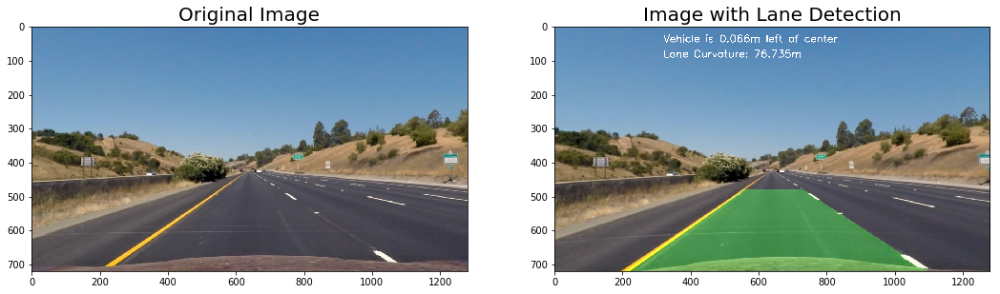

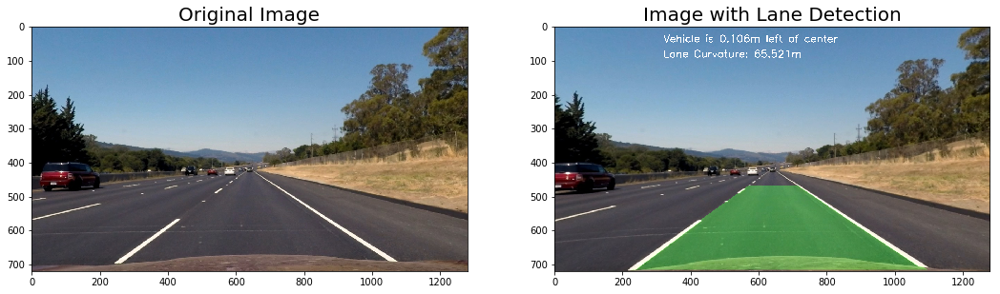

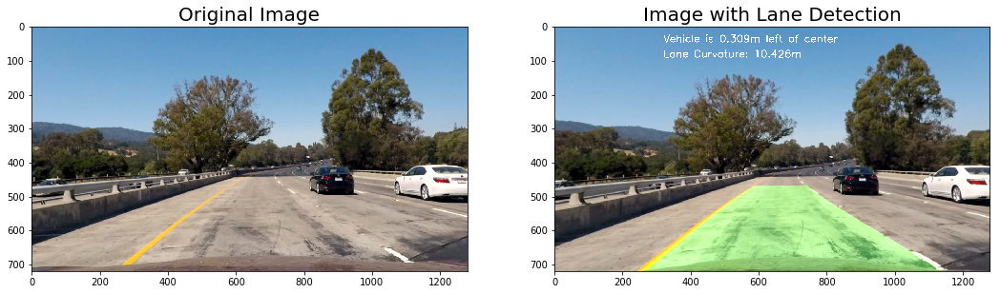

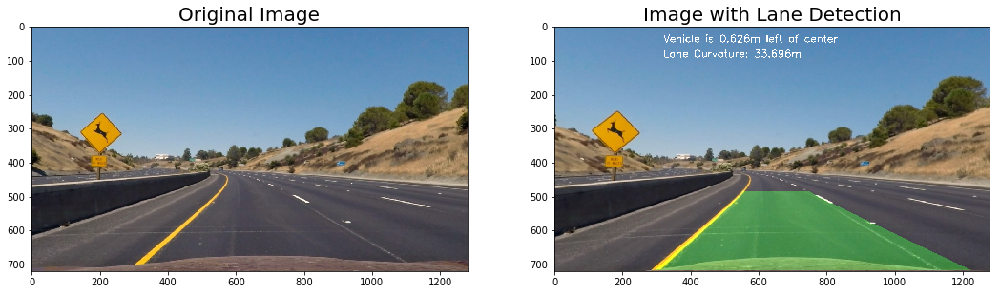

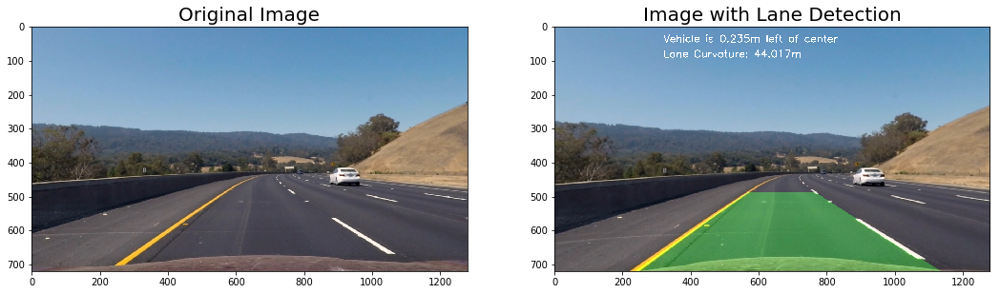

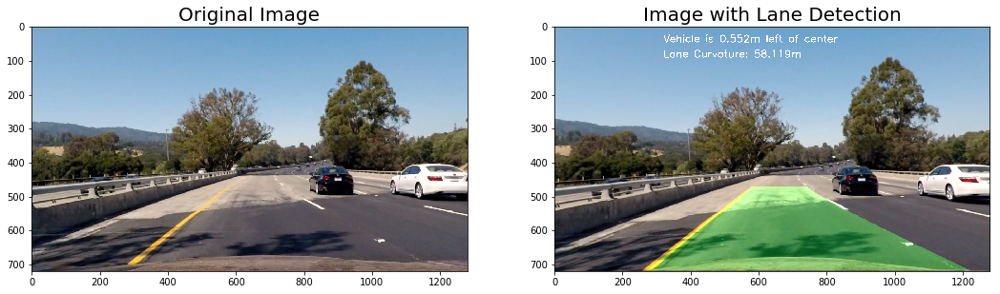

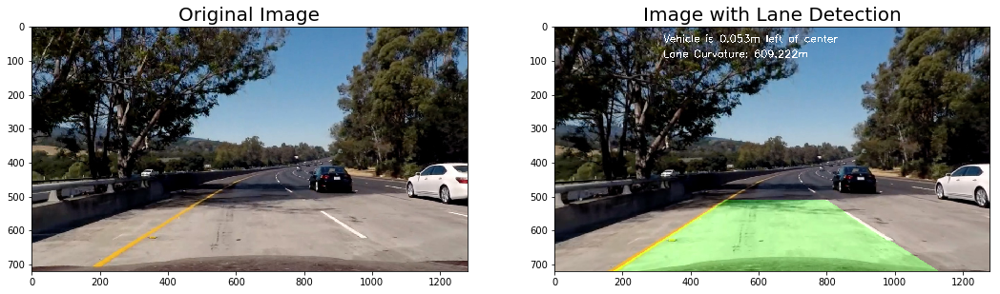

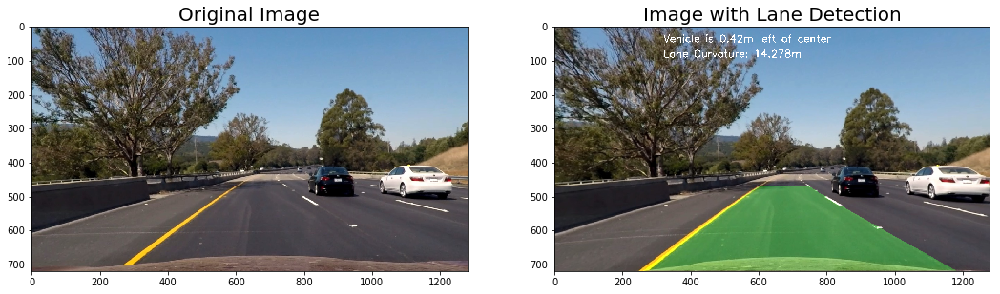

In [32]:
# Examples of lane detection on test images
for img in test_imgs:
    res = lane_detection(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(res)
    ax2.set_title('Image with Lane Detection', fontsize=20)

## Process Video

Draw lane lines on project video frames.

In [58]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output = 'output.mp4'
clip1 = VideoFileClip("project_video.mp4")
# NOTE: this function expects color images
clip = clip1.fl_image(lane_detection)
%time clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|█████████▉| 1260/1261 [14:13<00:00,  1.48it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

CPU times: user 14min 53s, sys: 11.5 s, total: 15min 4s
Wall time: 14min 14s


In [59]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))